# (25) Migrate: DataLoader -> Feeder (debug)

host = ```any```, device = ```any```

**Motivation**: <br>


In [1]:
# HIDE CODE


project_name = '_TemporalSC'


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-progress-2025/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-progress-2025/figs')
tmp_dir = os.path.join(git_dir, 'jb-progress-2025/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, project_name))
from figures.convergence import plot_convergence
from main.config_defaults import default_configs
from figures.fighelper import *
from main.train import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
device_idx = 0
device = f'cuda:{device_idx}'

print(f"device: {device}  ———  host: {os.uname().nodename}")

device: cuda:0  ———  host: mach

In [3]:
from main.datafeeder import StationaryFeeder, RotateFeeder, TranslateFeeder

## RotateFeeder

In [4]:
trn, vld, _ = make_dataset('MNIST', device=device)

trn[0].shape, trn[1].shape, vld[0].shape, vld[1].shape

(torch.Size([60000, 1, 28, 28]),
 torch.Size([60000]),
 torch.Size([10000, 1, 28, 28]),
 torch.Size([10000]))

In [5]:
feeder = RotateFeeder(
    x=trn[0],
    y=trn[1],
    batch_size=1000,
    iters_per_epoch=None,
    drop_last=True,
    shuffle=True,
    flatten=False,
    device=device,
    seed_base=0,
    #
    theta_0=0,
    delta_theta=8.0,
)
feeder.iters_per_epoch

60

In [6]:
epoch = 0
feeder.set_epoch(epoch)

i = 0
gstep = epoch * feeder.iters_per_epoch + i
feeder.set_rng(gstep)
_ = feeder.get_batch_data(i)

x_rot = []
for t in range(120):
    x, *_ = feeder.step()
    x_rot.append(x)
x_rot = torch.stack(x_rot, dim=1)
x_rot.shape

torch.Size([1000, 120, 1, 28, 28])

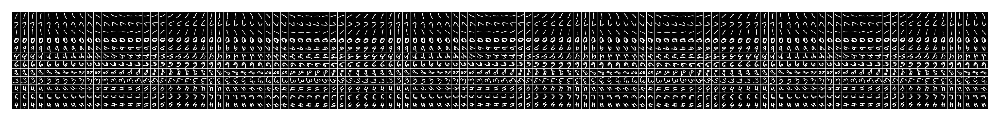

In [7]:
num = 12
x2p = x_rot[:num].view(-1, 28, 28)
_ = plot_weights(x2p, method='min-max', nrows=num, dpi=500)

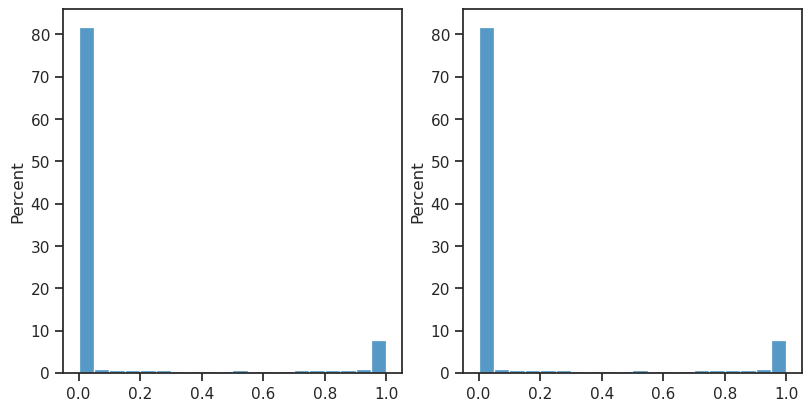

In [8]:
fig, axes = create_figure(1, 2, (8, 4))
sns.histplot(tonp(x_rot[:123, 0].ravel()), stat='percent', bins=20, ax=axes[0])
sns.histplot(tonp(x_rot[:123, 45].ravel()), stat='percent', bins=20, ax=axes[1]);

In [9]:
feeder = RotateFeeder(
    x=trn[0],
    y=trn[1],
    batch_size=200,
    iters_per_epoch=None,
    drop_last=True,
    shuffle=True,
    flatten=False,
    device=device,
    seed_base=0,
    #
    theta_0=None,
    delta_theta=8.0,
)
feeder.iters_per_epoch

300

In [10]:
epoch = 123

feeder.set_epoch(epoch=epoch)

for i in tqdm(range(feeder.iters_per_epoch)):
    gstep = epoch * feeder.iters_per_epoch + i
    feeder.set_rng(gstep)
    _ = feeder.get_batch_data(i)

    for t in range(32):
        x, *_ = feeder.step()

100%|█████████████████████████████████████████| 300/300 [00:04<00:00, 67.08it/s]


100%|█████████████████████████████████████████| 300/300 [00:03<00:00, 80.92it/s]


100%|█████████████████████████████████████████| 300/300 [00:05<00:00, 57.84it/s]


100%|█████████████████████████████████████████| 300/300 [00:04<00:00, 63.85it/s]


  0%|                                                   | 0/300 [00:00<?, ?it/s]

0

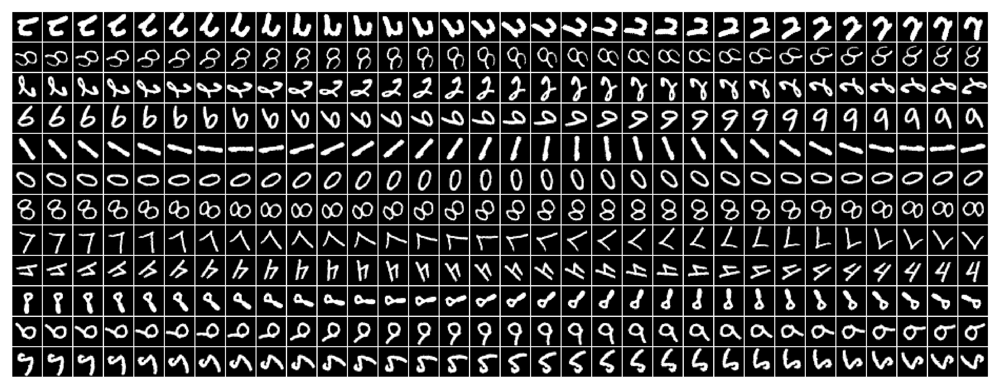

  0%|▏                                          | 1/300 [00:00<03:48,  1.31it/s]

1

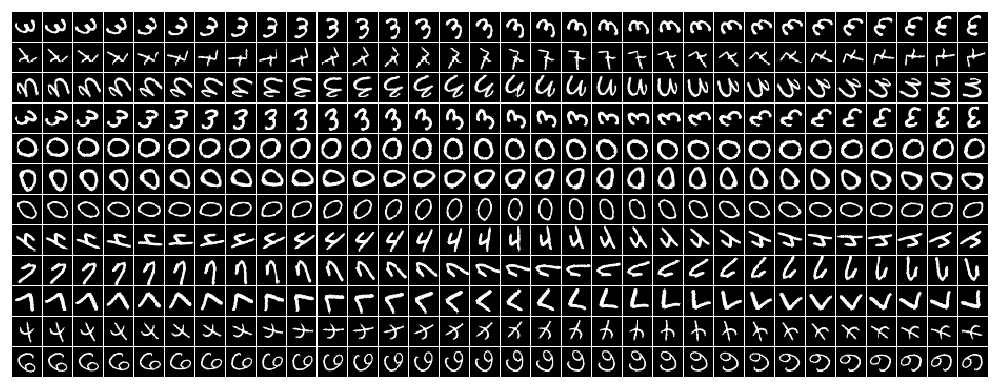

  1%|▎                                          | 2/300 [00:01<03:30,  1.42it/s]

2

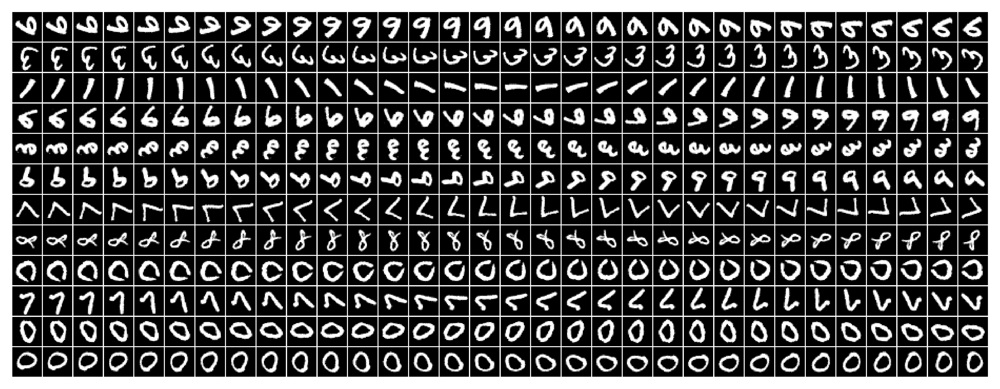

  1%|▍                                          | 3/300 [00:02<03:24,  1.45it/s]

3

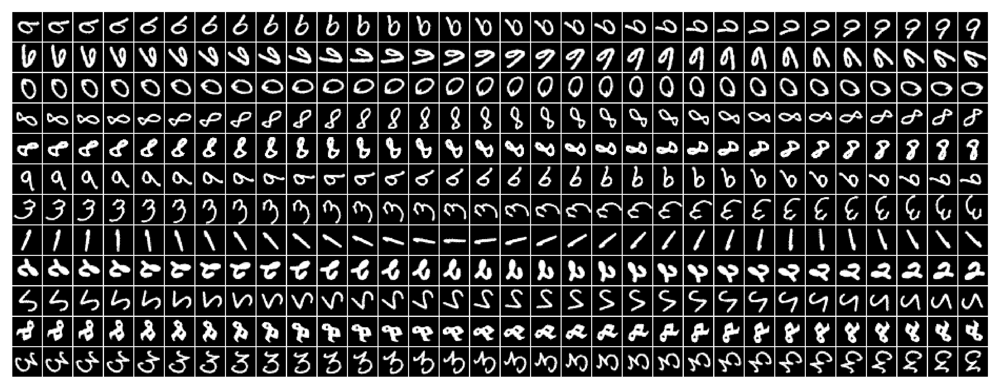

  1%|▌                                          | 4/300 [00:02<03:21,  1.47it/s]

4

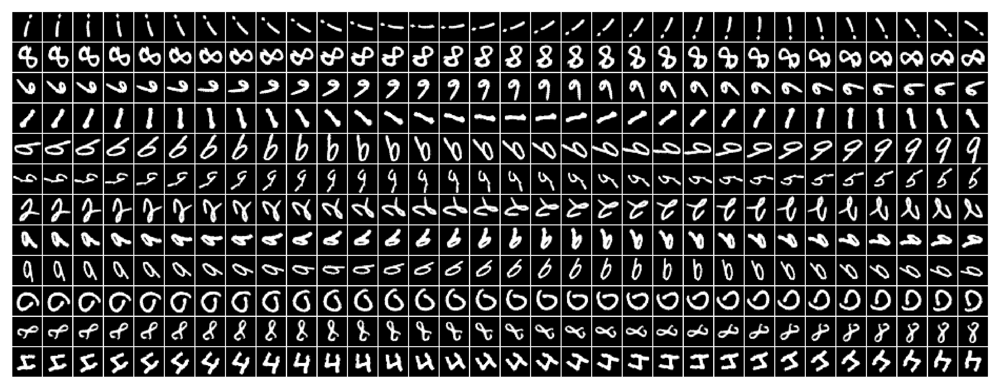

  2%|▋                                          | 5/300 [00:03<03:18,  1.48it/s]

5

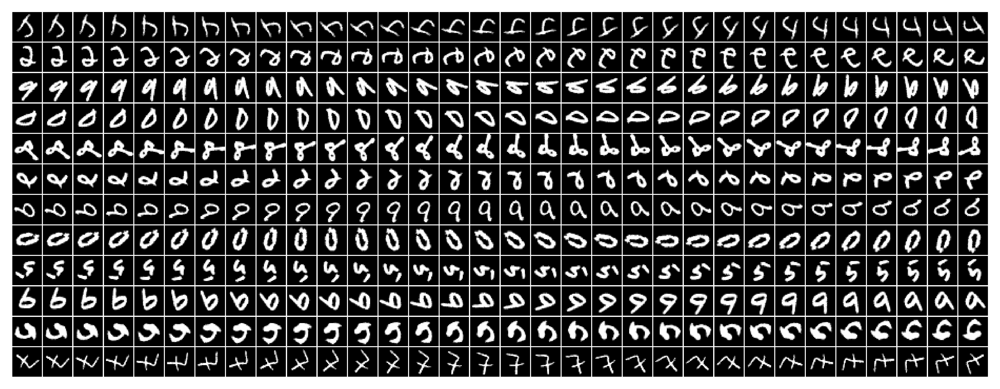

  2%|▊                                          | 6/300 [00:04<03:17,  1.49it/s]

6

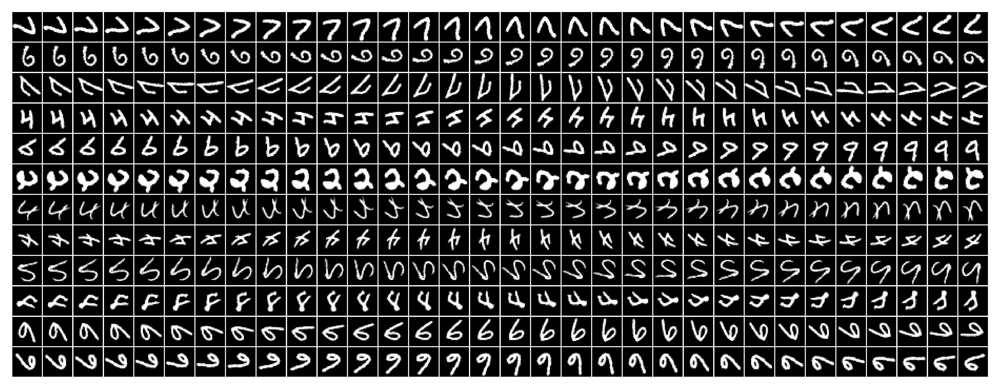

  2%|▊                                          | 6/300 [00:04<03:53,  1.26it/s]


In [11]:
epoch = 123

feeder.set_epoch(epoch=epoch)

for i in tqdm(range(feeder.iters_per_epoch)):
    gstep = epoch * feeder.iters_per_epoch + i
    feeder.set_rng(gstep)
    _ = feeder.get_batch_data(i)

    x_rot = []
    for t in range(32):
        x, *_ = feeder.step()
        x_rot.append(x)
    x_rot = torch.stack(x_rot, dim=1)
    
    print(i)
    num = 12
    x2p = x_rot[:num].view(-1, 28, 28)
    _ = plot_weights(x2p, method='min-max', nrows=num, dpi=500)

    if i > 5:
        break

## TranslateFeeder

In [12]:
model_type = 'poisson'
cfg_vae, cfg_tr = default_configs('Kyoto-wht+translate', model_type, 'ngd|lin')

cfg_vae['feeder_cfg'] = {'iters_per_epoch': 1000}

cfg_tr['epochs'] = 150
cfg_tr['batch_size'] = 200

In [13]:
model = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**cfg_vae))
tr = Trainer(model, ConfigTrain(**cfg_tr), device=device)

tr.n_iters

150000

In [14]:
epoch = 123

tr.feeder_trn.set_epoch(epoch=epoch)

for i in tqdm(range(len(tr.feeder_trn))):
    gstep = epoch * len(tr.feeder_trn) + i
    tr.feeder_trn.set_rng(gstep)
    _ = tr.feeder_trn.get_batch_data(i)

    for t in range(32):
        x, *_ = tr.feeder_trn.step()

100%|███████████████████████████████████████| 1000/1000 [00:14<00:00, 68.19it/s]


  0%|                                                  | 0/1000 [00:00<?, ?it/s]

0

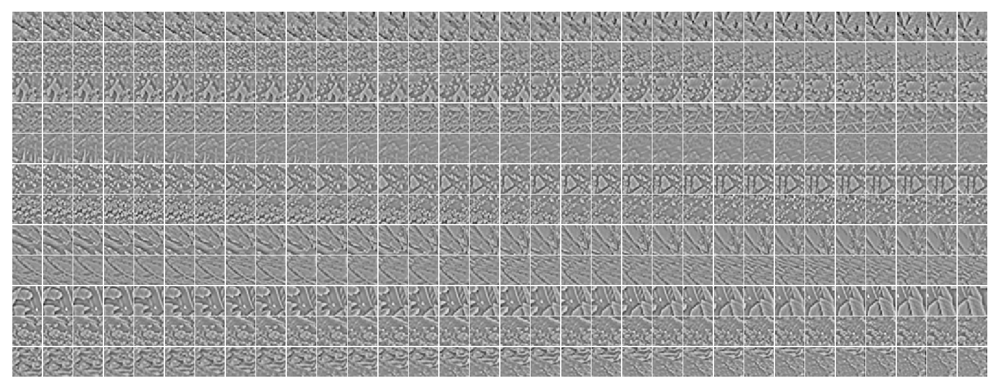

  0%|                                          | 1/1000 [00:00<03:36,  4.62it/s]

1

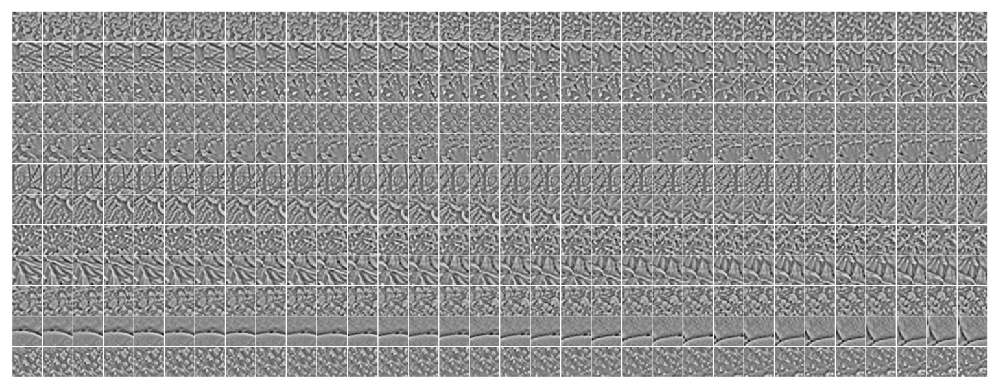

  0%|                                          | 2/1000 [00:00<03:33,  4.68it/s]

2

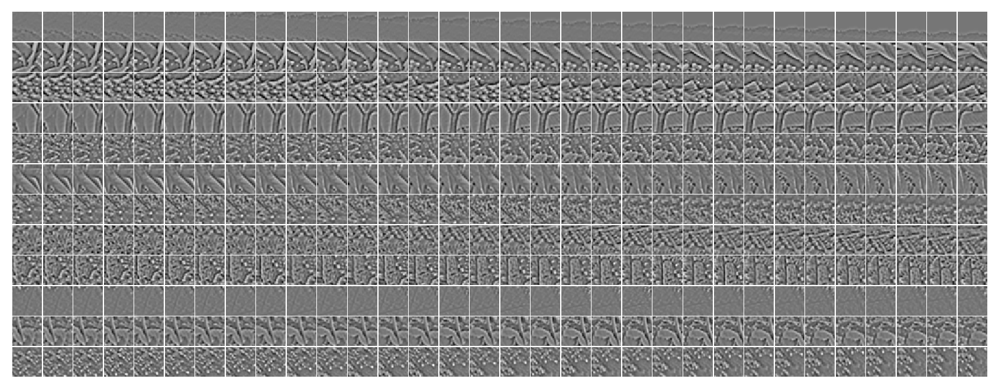

  0%|▏                                         | 3/1000 [00:00<03:30,  4.74it/s]

3

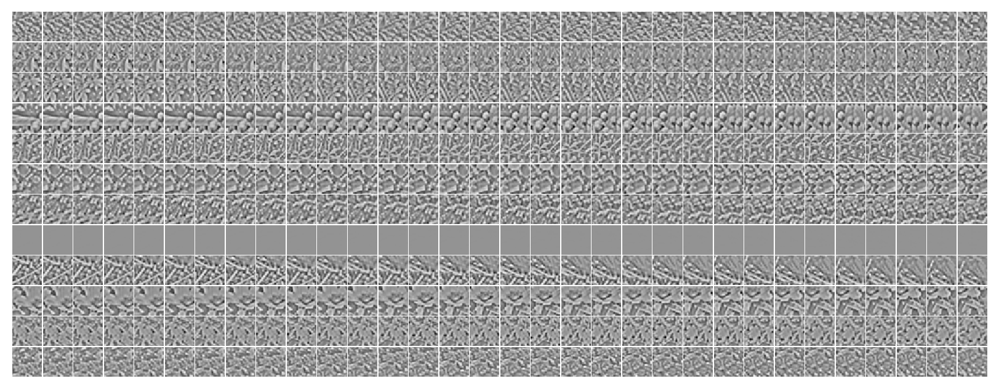

  0%|▏                                         | 4/1000 [00:00<03:26,  4.82it/s]

4

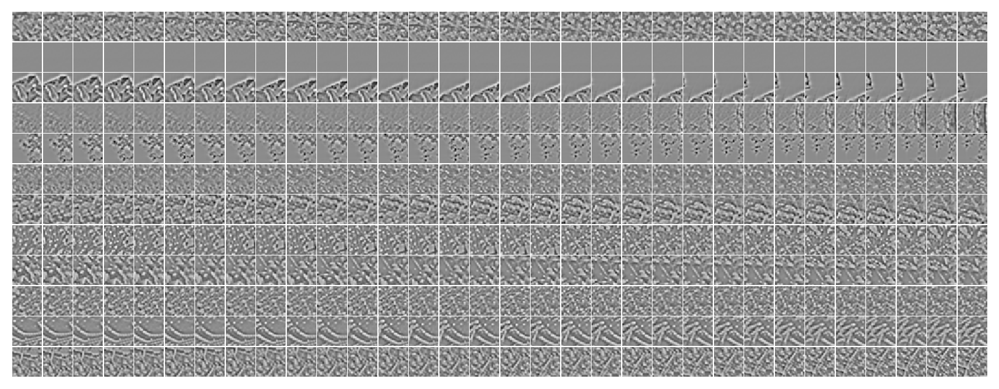

  0%|▏                                         | 5/1000 [00:01<03:24,  4.86it/s]

5

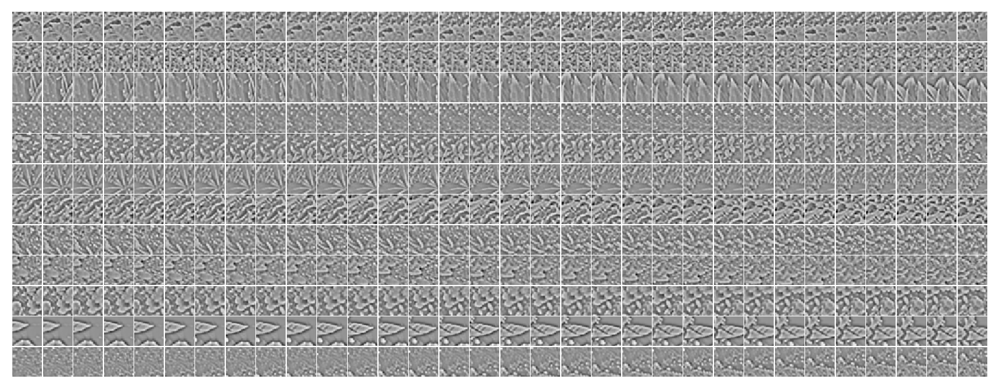

  1%|▎                                         | 6/1000 [00:01<03:25,  4.83it/s]

6

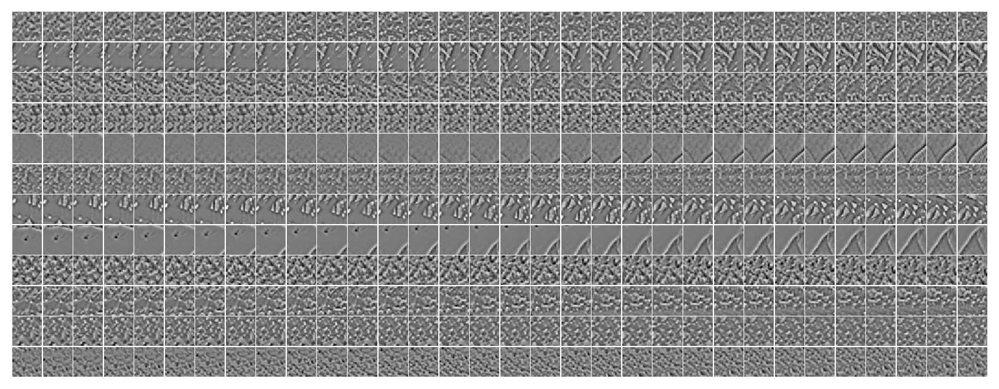

  1%|▎                                         | 7/1000 [00:01<03:26,  4.81it/s]

7

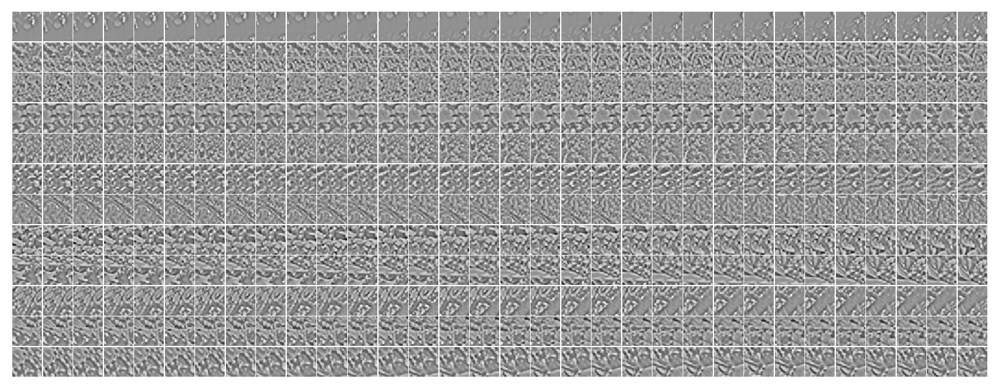

  1%|▎                                         | 8/1000 [00:01<03:25,  4.82it/s]

8

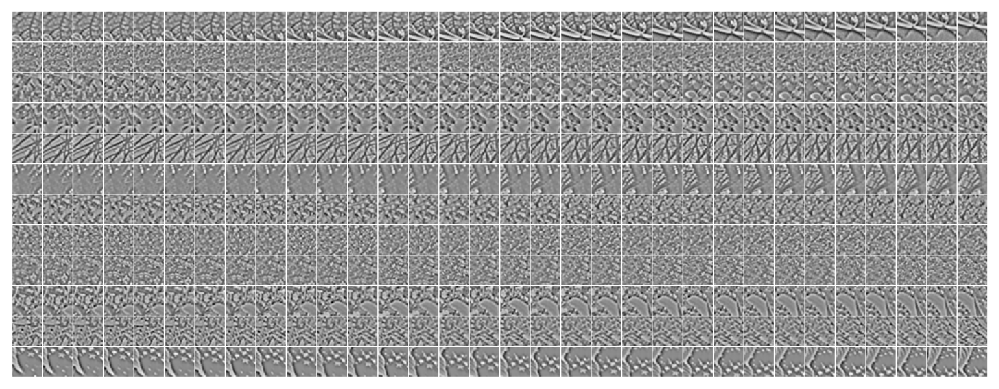

  1%|▍                                         | 9/1000 [00:01<03:25,  4.82it/s]

9

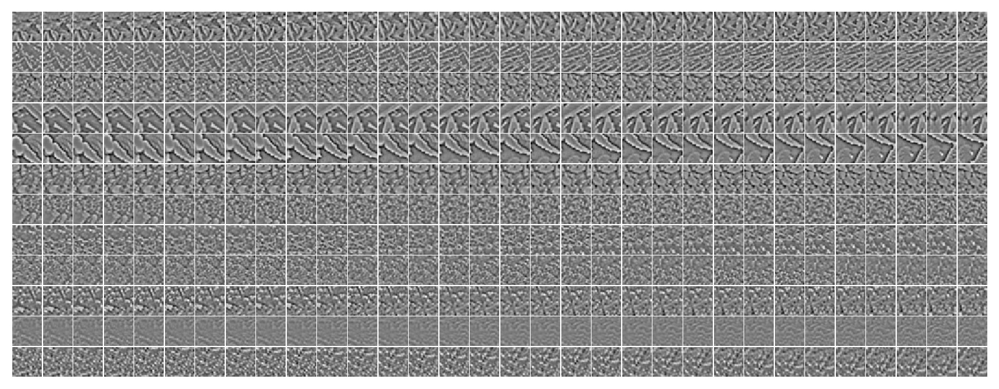

  1%|▍                                        | 10/1000 [00:02<03:26,  4.80it/s]

10

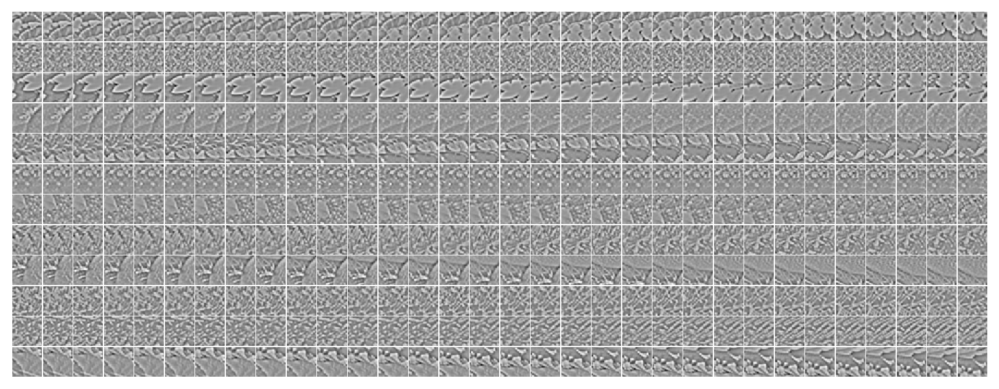

  1%|▍                                        | 11/1000 [00:02<03:27,  4.77it/s]

11

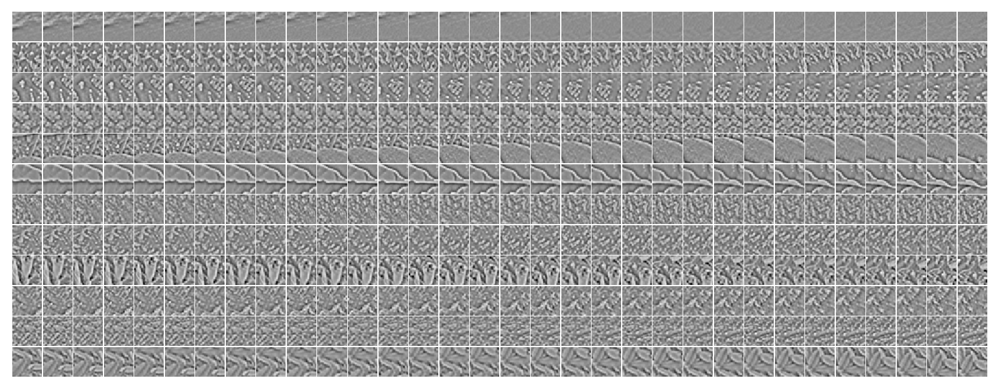

  1%|▍                                        | 11/1000 [00:02<03:45,  4.38it/s]


In [15]:
epoch = 123

tr.feeder_trn.set_epoch(epoch=epoch)

for i in tqdm(range(len(tr.feeder_trn))):
    gstep = epoch * len(tr.feeder_trn) + i
    tr.feeder_trn.set_rng(gstep)
    _ = tr.feeder_trn.get_batch_data(i)

    x_rot = []
    for t in range(32):
        x, *_ = tr.feeder_trn.step()
        x_rot.append(x)
    x_rot = torch.stack(x_rot, dim=1)

    print(i)
    num = 12
    x2p = x_rot[:num].view(-1, tr.feeder_trn.s, tr.feeder_trn.s)
    _ = plot_weights(x2p, method='none', nrows=num, dpi=200)

    if i > 10:
        break